# Street Clip

**StreetCLIP** is a robust foundation model for open-domain image geolocalization and other geographic and climate-related tasks.

Trained on an original dataset of 1.1 million street-level urban and rural geo-tagged images, it achieves state-of-the-art performance on multiple open-domain image geolocalization benchmarks in **zero-shot**, outperforming supervised models trained on millions of images.

In [1]:
import pandas as pd
import gradio as gr
import itertools
import seaborn as sns
import sys
import torch

from PIL import Image
from transformers import CLIPProcessor, CLIPModel

In [2]:
sys.version

'3.10.10 (main, Mar 21 2023, 18:45:11) [GCC 11.2.0]'

## Model loading

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"{str(device).upper()} is available.")

CPU is available.


In [4]:
model = CLIPModel.from_pretrained("geolocal/StreetCLIP")
processor = CLIPProcessor.from_pretrained("geolocal/StreetCLIP")

model.to(device)

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 768)
      (position_embedding): Embedding(77, 768)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=768, out_features=768, bias=True)
            (v_proj): Linear(in_features=768, out_features=768, bias=True)
            (q_proj): Linear(in_features=768, out_features=768, bias=True)
            (out_proj): Linear(in_features=768, out_features=768, bias=True)
          )
          (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=768, out_features=3072, bias=True)
            (fc2): Linear(in_features=3072, out_features=768, bias=True)
          )
          (layer_norm2): LayerNorm((768,), eps=1e-05,

## List of countries

In [5]:
countries = [
    "Afghanistan",
    "Albania",
    "Algeria",
    "Andorra",
    "Angola",
    "Antigua and Barbuda",
    "Argentina",
    "Armenia",
    "Australia",
    "Austria",
    "Azerbaijan",
    "Bahamas",
    "Bahrain",
    "Bangladesh",
    "Barbados",
    "Belarus",
    "Belgium",
    "Belize",
    "Benin",
    "Bhutan",
    "Bolivia",
    "Bosnia and Herzegovina",
    "Botswana",
    "Brazil",
    "Brunei",
    "Bulgaria",
    "Burkina Faso",
    "Burundi",
    "Cabo Verde",
    "Cambodia",
    "Cameroon",
    "Canada",
    "Central African Republic",
    "Chad",
    "Chile",
    "China",
    "Colombia",
    "Comoros",
    "Congo (Congo-Brazzaville)",
    "Costa Rica",
    "Croatia",
    "Cuba",
    "Cyprus",
    "Czechia (Czech Republic)",
    "Democratic Republic of the Congo (Congo-Kinshasa)",
    "Denmark",
    "Djibouti",
    "Dominica",
    "Dominican Republic",
    "Ecuador",
    "Egypt",
    "El Salvador",
    "Equatorial Guinea",
    "Eritrea",
    "Estonia",
    "Eswatini (fmr. Swaziland)",
    "Ethiopia",
    "Fiji",
    "Finland",
    "France",
    "Gabon",
    "Gambia",
    "Georgia",
    "Germany",
    "Ghana",
    "Greece",
    "Grenada",
    "Guatemala",
    "Guinea",
    "Guinea-Bissau",
    "Guyana",
    "Haiti",
    "Honduras",
    "Hungary",
    "Iceland",
    "India",
    "Indonesia",
    "Iran",
    "Iraq",
    "Ireland",
    "Israel",
    "Italy",
    "Ivory Coast",
    "Jamaica",
    "Japan",
    "Jordan",
    "Kazakhstan",
    "Kenya",
    "Kiribati",
    "Kuwait",
    "Kyrgyzstan",
    "Laos",
    "Latvia",
    "Lebanon",
    "Lesotho",
    "Liberia",
    "Libya",
    "Liechtenstein",
    "Lithuania",
    "Luxembourg",
    "Madagascar",
    "Malawi",
    "Malaysia",
    "Maldives",
    "Mali",
    "Malta",
    "Marshall Islands",
    "Mauritania",
    "Mauritius",
    "Mexico",
    "Micronesia",
    "Moldova",
    "Monaco",
    "Mongolia",
    "Montenegro",
    "Morocco",
    "Mozambique",
    "Myanmar (formerly Burma)",
    "Namibia",
    "Nauru",
    "Nepal",
    "Netherlands",
    "New Zealand",
    "Nicaragua",
    "Niger",
    "Nigeria",
    "North Korea",
    "North Macedonia (formerly Macedonia)",
    "Norway",
    "Oman",
    "Pakistan",
    "Palau",
    "Palestine State",
    "Panama",
    "Papua New Guinea",
    "Paraguay",
    "Peru",
    "Philippines",
    "Poland",
    "Portugal",
    "Qatar",
    "Romania",
    "Russia",
    "Rwanda",
    "Saint Kitts and Nevis",
    "Saint Lucia",
    "Saint Vincent and the Grenadines",
    "Samoa",
    "San Marino",
    "Sao Tome and Principe",
    "Saudi Arabia",
    "Senegal",
    "Serbia",
    "Seychelles",
    "Sierra Leone",
    "Singapore",
    "Slovakia",
    "Slovenia",
    "Solomon Islands",
    "Somalia",
    "South Africa",
    "South Korea",
    "South Sudan",
    "Spain",
    "Sri Lanka",
    "Sudan",
    "Suriname",
    "Sweden",
    "Switzerland",
    "Syria",
    "Tajikistan",
    "Tanzania",
    "Thailand",
    "Timor-Leste",
    "Togo",
    "Tonga",
    "Trinidad and Tobago",
    "Tunisia",
    "Turkey",
    "Turkmenistan",
    "Tuvalu",
    "Uganda",
    "Ukraine",
    "United Arab Emirates",
    "United Kingdom",
    "United States of America",
    "Uruguay",
    "Uzbekistan",
    "Vanuatu",
    "Venezuela",
    "Vietnam",
    "Yemen",
    "Zambia",
    "Zimbabwe"
]

In [6]:
print("Number of countries in this list:", len(countries))

Number of countries in this list: 194


In [7]:
def find_location(image, labels, topn=10):
    """
    Find location from an image with Street View
    Input: image (PIL format), list of labels, topn
    Otput: topn
    """
    if device == "gpu":
        inputs = processor(
            text=labels, images=image, return_tensors="pt", padding=True
        ).to(device)
    else:
        inputs = processor(text=labels, images=image, return_tensors="pt", padding=True)

    with torch.no_grad():
        outputs = model(**inputs)

    logits_per_image = outputs.logits_per_image
    prediction = logits_per_image.softmax(dim=1)

    scores = {labels[i]: float(prediction[0][i].item()) for i in range(len(labels))}
    sorted_countries = sorted(scores.items(), key=lambda x: x[1], reverse=True)
    sorted_scores = dict(sorted_countries)
    top = dict(itertools.islice(sorted_scores.items(), topn))

    df = pd.DataFrame(list(top.items()), columns=["Location", "Confidence"])
    print("Top", topn, "predicted locations")

    return df

## Detecting country from the image

In [8]:
cm = sns.light_palette("purple", as_cmap=True)

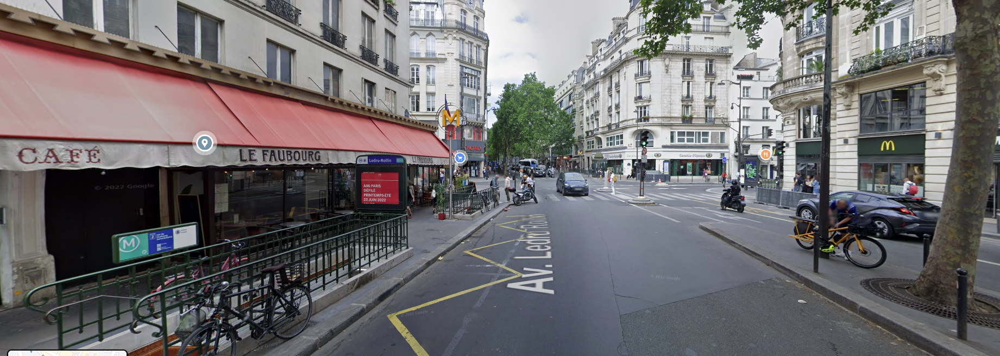

In [9]:
image_path = "images/paris_streetview.png"

img = Image.open(image_path)
img

In [10]:
df = find_location(img, countries, 10)
df.style.background_gradient(cmap=cm)

Top 10 predicted locations


,Location,Confidence
0,France,0.909773
1,Gabon,0.019677
2,Monaco,0.014188
3,Mali,0.007668
4,Belgium,0.006332
5,Niger,0.005346
6,Togo,0.003557
7,Cameroon,0.003481
8,Palau,0.002945
9,India,0.002902


In [11]:
print(f"Country is {df.iloc[0]['Location']} with confidence = {df.iloc[0]['Confidence']}")

Country is France with confidence = 0.909773051738739


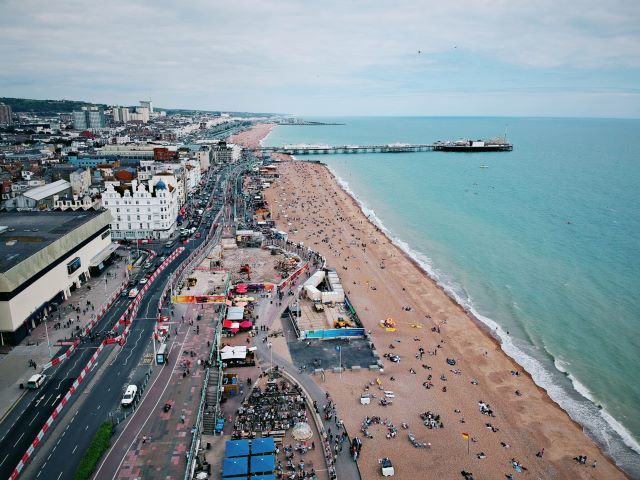

In [12]:
image_path = "images/brighton.jpg"

img = Image.open(image_path)
img

In [13]:
df = find_location(img, countries, 10)
df.style.background_gradient(cmap=cm)

Top 10 predicted locations


,Location,Confidence
0,United Kingdom,0.907634
1,France,0.010189
2,Jordan,0.008483
3,Somalia,0.007987
4,Israel,0.004359
5,Palestine State,0.004311
6,Spain,0.003569
7,India,0.003342
8,North Korea,0.003054
9,Russia,0.003029


In [14]:
print(f"Country is {df.iloc[0]['Location']} with confidence = {df.iloc[0]['Confidence']}")

Country is United Kingdom with confidence = 0.9076343178749084


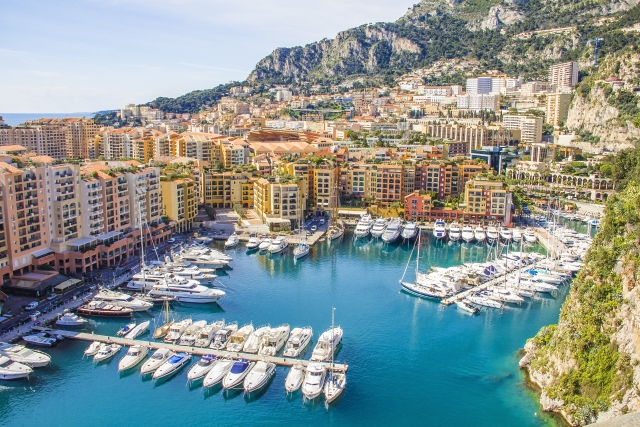

In [15]:
image_path = "images/monaco.jpg"

img = Image.open(image_path)
img

In [16]:
df = find_location(img, countries, 10)
df.style.background_gradient(cmap=cm)

Top 10 predicted locations


,Location,Confidence
0,Monaco,0.992657
1,France,0.004401
2,Italy,0.000998
3,Spain,0.000269
4,Turkey,0.000256
5,Algeria,0.000174
6,Ivory Coast,0.000138
7,Andorra,0.000103
8,Palau,0.000084
9,Montenegro,0.000076


In [17]:
print(f"Country is {df.iloc[0]['Location']} with confidence = {df.iloc[0]['Confidence']}")

Country is Monaco with confidence = 0.9926567673683167


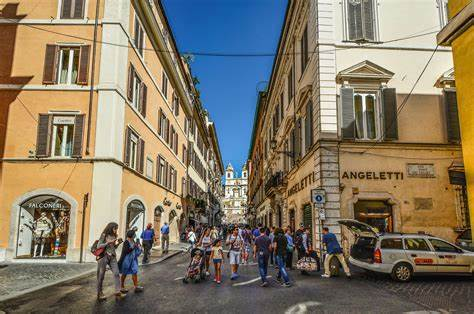

In [18]:
image_path = "images/rome.jpg"

img = Image.open(image_path)
img

In [19]:
df = find_location(img, countries, 10)
df.style.background_gradient(cmap=cm)

Top 10 predicted locations


,Location,Confidence
0,Italy,0.944992
1,San Marino,0.014663
2,Palau,0.007448
3,Algeria,0.005796
4,Argentina,0.004959
5,Eritrea,0.004242
6,Albania,0.002162
7,Sweden,0.001507
8,Monaco,0.000926
9,Georgia,0.000849


In [20]:
print(f"Country is {df.iloc[0]['Location']} with confidence = {df.iloc[0]['Confidence']}")

Country is Italy with confidence = 0.9449921250343323


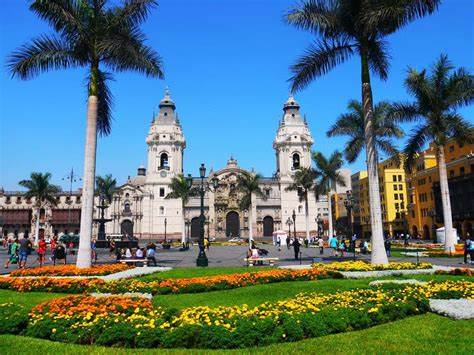

In [21]:
image_path = "images/peru.jpg"

img = Image.open(image_path)
img

In [22]:
df = find_location(img, countries, 10)
df.style.background_gradient(cmap=cm)

Top 10 predicted locations


,Location,Confidence
0,Peru,0.890720
1,Ecuador,0.051409
2,Colombia,0.035159
3,Bolivia,0.009892
4,Chile,0.004225
5,Armenia,0.003025
6,Panama,0.000954
7,Paraguay,0.000872
8,Guinea,0.000814
9,Guatemala,0.000423


In [23]:
print(f"Country is {df.iloc[0]['Location']} with confidence = {df.iloc[0]['Confidence']}")

Country is Peru with confidence = 0.8907197713851929


## Detecting city from the image

In [24]:
cities = [
    "Paris",
    "Marseille",
    "Nice",
    "Cabourg",
    "Rennes",
    "Bordeaux",
    "Nice",
    "Brest",
    "Valence",
    "Lille",
    "Strasbourg",
    "Nantes",
    "Issy les Moulineaux",
]

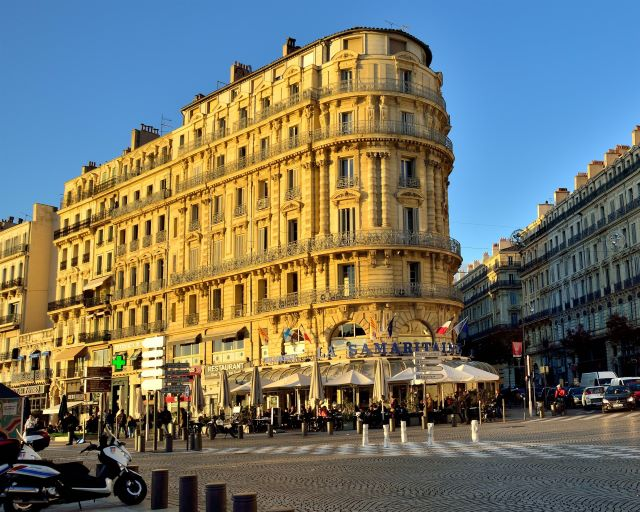

In [25]:
image_path = "images/marseille.jpg"

img = Image.open(image_path)
img

In [26]:
df = find_location(img, cities, 10)
df.style.background_gradient(cmap=cm)

Top 10 predicted locations


,Location,Confidence
0,Marseille,0.671189
1,Bordeaux,0.126228
2,Lille,0.087006
3,Paris,0.042359
4,Nantes,0.038657
5,Rennes,0.016358
6,Valence,0.010515
7,Strasbourg,0.002736
8,Issy les Moulineaux,0.002702
9,Brest,0.001728


In [27]:
print(f"City is {df.iloc[0]['Location']} with confidence = {df.iloc[0]['Confidence']}")

City is Marseille with confidence = 0.67118901014328


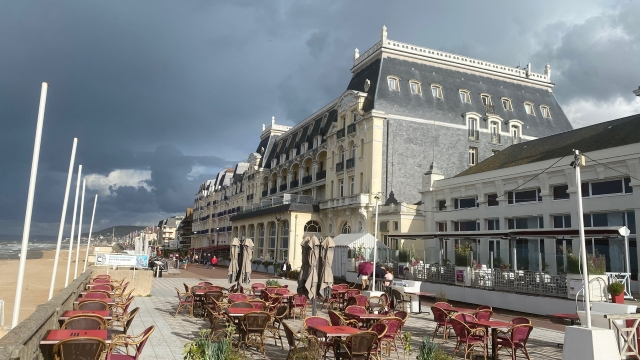

In [28]:
image_path = "images/cabourg.jpg"

img = Image.open(image_path)
img

In [29]:
df = find_location(img, cities, 10)
df.style.background_gradient(cmap=cm)

Top 10 predicted locations


,Location,Confidence
0,Cabourg,0.997915
1,Lille,0.000827
2,Brest,0.000629
3,Nantes,0.000164
4,Rennes,0.000149
5,Bordeaux,0.000130
6,Nice,0.000051
7,Issy les Moulineaux,0.000034
8,Paris,0.000022
9,Valence,0.000022


In [30]:
print(f"City is {df.iloc[0]['Location']} with confidence = {df.iloc[0]['Confidence']}")

City is Cabourg with confidence = 0.9979148507118225


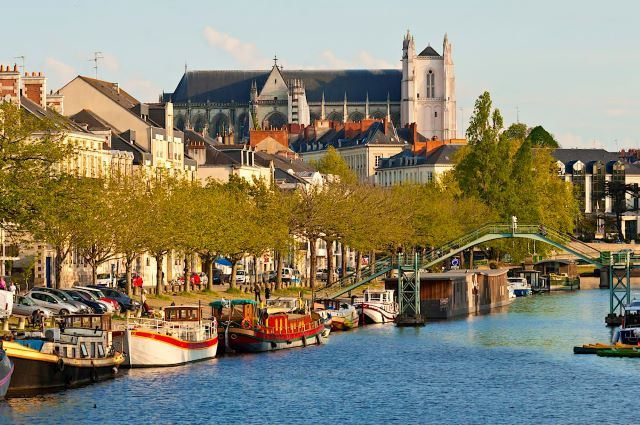

In [31]:
image_path = "images/nantes.jpg"

img = Image.open(image_path)
img

In [32]:
df = find_location(img, cities, 10)
df.style.background_gradient(cmap=cm)

Top 10 predicted locations


,Location,Confidence
0,Nantes,0.924581
1,Rennes,0.031408
2,Brest,0.020801
3,Bordeaux,0.015885
4,Strasbourg,0.005215
5,Lille,0.001565
6,Valence,0.000216
7,Paris,0.000181
8,Issy les Moulineaux,0.000120
9,Marseille,0.000019


In [33]:
print(f"City is {df.iloc[0]['Location']} with confidence = {df.iloc[0]['Confidence']}")

City is Nantes with confidence = 0.9245813488960266


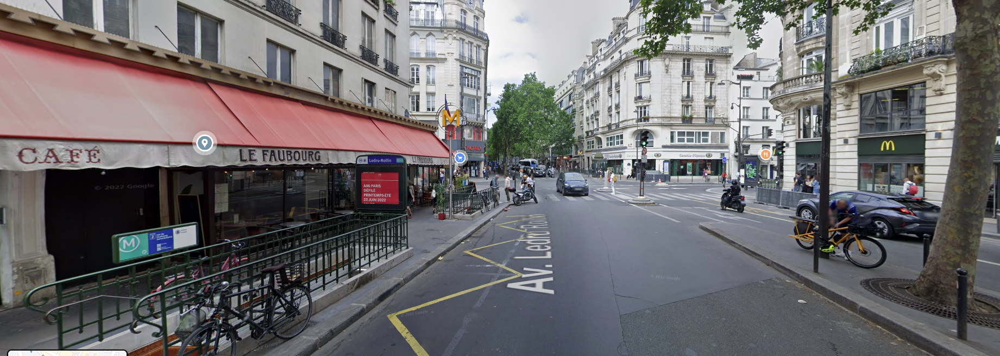

In [34]:
image_path = "images/paris_streetview.png"

img = Image.open(image_path)
img

In [35]:
df = find_location(img, cities, 10)
df.style.background_gradient(cmap=cm)

Top 10 predicted locations


,Location,Confidence
0,Paris,0.646852
1,Issy les Moulineaux,0.311270
2,Valence,0.007864
3,Lille,0.007244
4,Nantes,0.006721
5,Bordeaux,0.006542
6,Rennes,0.005682
7,Marseille,0.004961
8,Brest,0.001819
9,Strasbourg,0.000583


In [36]:
print(f"City is {df.iloc[0]['Location']} with confidence = {df.iloc[0]['Confidence']}")

City is Paris with confidence = 0.6468515396118164


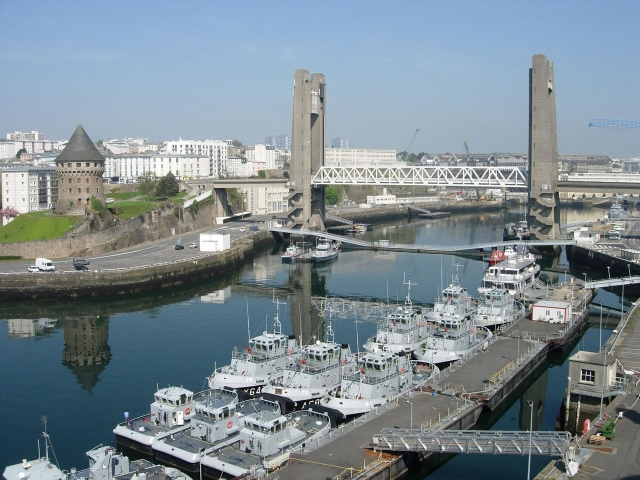

In [37]:
image_path = "images/brest.jpg"

img = Image.open(image_path)
img

In [38]:
df = find_location(img, cities, 10)
df.style.background_gradient(cmap=cm)

Top 10 predicted locations


,Location,Confidence
0,Brest,0.995859
1,Nantes,0.003677
2,Rennes,0.000420
3,Lille,0.000025
4,Bordeaux,0.000012
5,Marseille,0.000005
6,Valence,0.000001
7,Paris,0.000001
8,Issy les Moulineaux,0.000001
9,Strasbourg,0.000001


In [39]:
print(f"City is {df.iloc[0]['Location']} with confidence = {df.iloc[0]['Confidence']}")

City is Brest with confidence = 0.9958593249320984


## Gradio App

In [42]:
def find_country_from_image(image):
    """
    Find country location from image
    Input: PIL image
    Output: list of countries with confidence
    """
    inputs = processor(
        text=countries, images=image, return_tensors="pt", padding=True
    ).to(device)

    with torch.no_grad():
        outputs = model(**inputs)

    logits_per_image = outputs.logits_per_image
    prediction = logits_per_image.softmax(dim=1)
    results = {
        countries[i]: float(prediction[0][i].item()) for i in range(len(countries))
    }

    return results

In [44]:
image = gr.Image(label="Your image")

label = gr.Label(
    num_top_classes=10,
    label="Top 10 countries identification from the image",
)

samples = [
    "images/brighton.jpg",
    "images/marseille.jpg",
    "images/monaco.jpg",
    "images/paris.jpg",
    "images/paris_streetview.png",
    "images/peru.jpg",
    "images/rome.jpg",
]

header = "Finding location with StreetClip and Azure ML"

streetclip_webapp = gr.Interface(
    fn=find_country_from_image,
    inputs=image,
    outputs=label,
    title=header,
    examples=samples,
    theme="remilia/Ghostly",  # https://huggingface.co/spaces/gradio/theme-gallery
)

In [45]:
streetclip_webapp.launch(share=True)

Running on local URL:  http://127.0.0.1:7862
Running on public URL: https://be776bcf93fa5d4e0a.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades (NEW!), check out Spaces: https://huggingface.co/spaces
